In [ ]:
!pip install --upgrade -q diffusers accelerate transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 62.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.7/354.7 kB 30.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 113.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 109.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 80.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 57.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
from diffusers import DiffusionPipeline, EulerDiscreteScheduler, DPMSolverMultistepScheduler, AutoencoderKL
import torch
from diffusers.utils import make_image_grid

In [ ]:
class Config:
  def __init__(self):
    self.stableCheckpoint = 'stable-diffusion-v1-5/stable-diffusion-v1-5'
    self.dreamlike = 'dreamlike-art/dreamlike-photoreal-2.0'
    self.stableEncoder = 'stabilityai/sd-vae-ft-mse'


config = Config()

In [ ]:
pipeline = DiffusionPipeline.from_pretrained(config.dreamlike, use_safetensors=True, torch_dtype=torch.float16)

pipeline = pipeline.to("cuda")

pipeline.scheduler = DPMSolverMultistepScheduler.from_config(pipeline.scheduler.config)

pipeline.enable_attention_slicing()

pipeline.enable_sequential_cpu_offload()

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/511 [00:00<?, ?B/s]

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/807 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/901 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/341 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/577 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

In [ ]:
#vae = AutoencoderKL.from_pretrained(config.stableEncoder, torch_dtype=torch.float16).to("cuda")

#pipeline.vae = vae

In [ ]:
prompt = "a more realistic rust pipe under the sea"

In [ ]:
def get_inputs(batch_size=1):
    generator = [torch.Generator("cuda").manual_seed(i) for i in range(batch_size)]
    prompts = batch_size * [prompt]
    num_inference_steps = 20

    return {"prompt": prompts,  "num_inference_steps": num_inference_steps}

  0%|          | 0/20 [00:00<?, ?it/s]

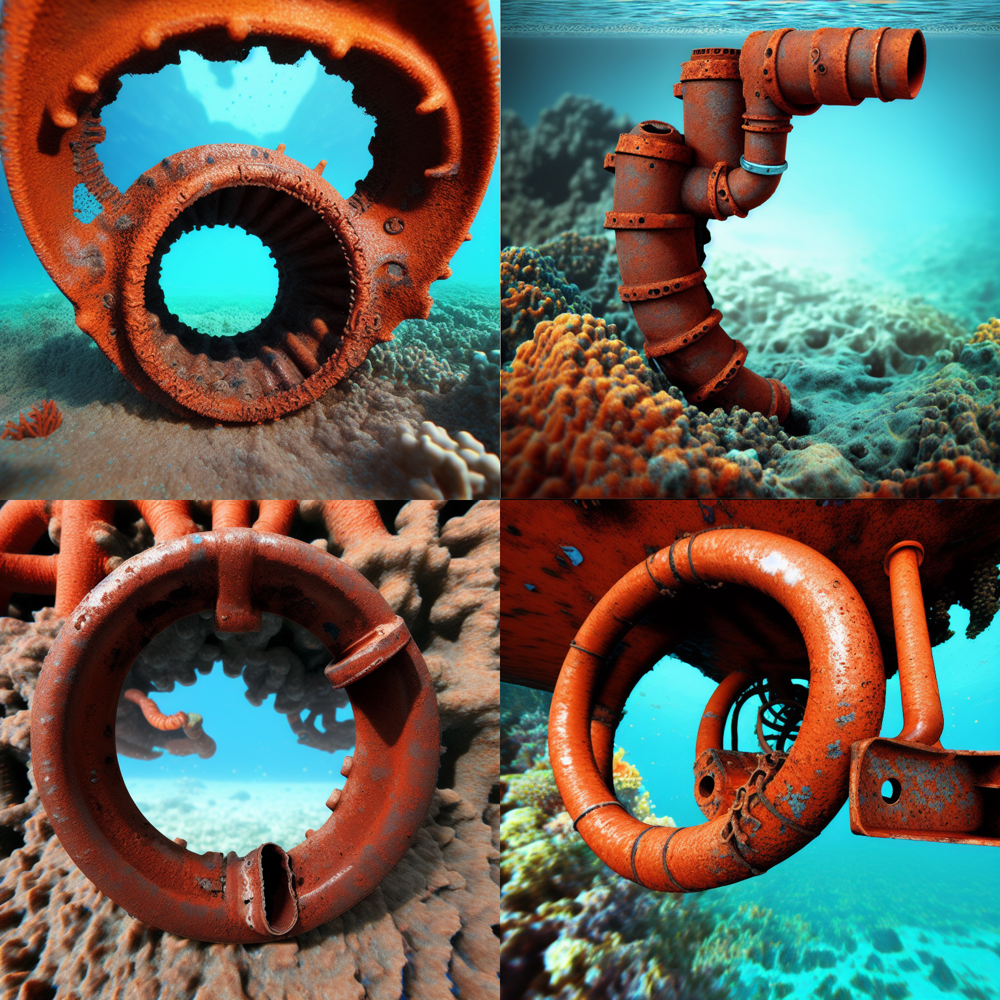

In [ ]:
images = pipeline(**get_inputs(batch_size=4)).images
make_image_grid(images, rows=2, cols=2)

  0%|          | 0/25 [00:00<?, ?it/s]

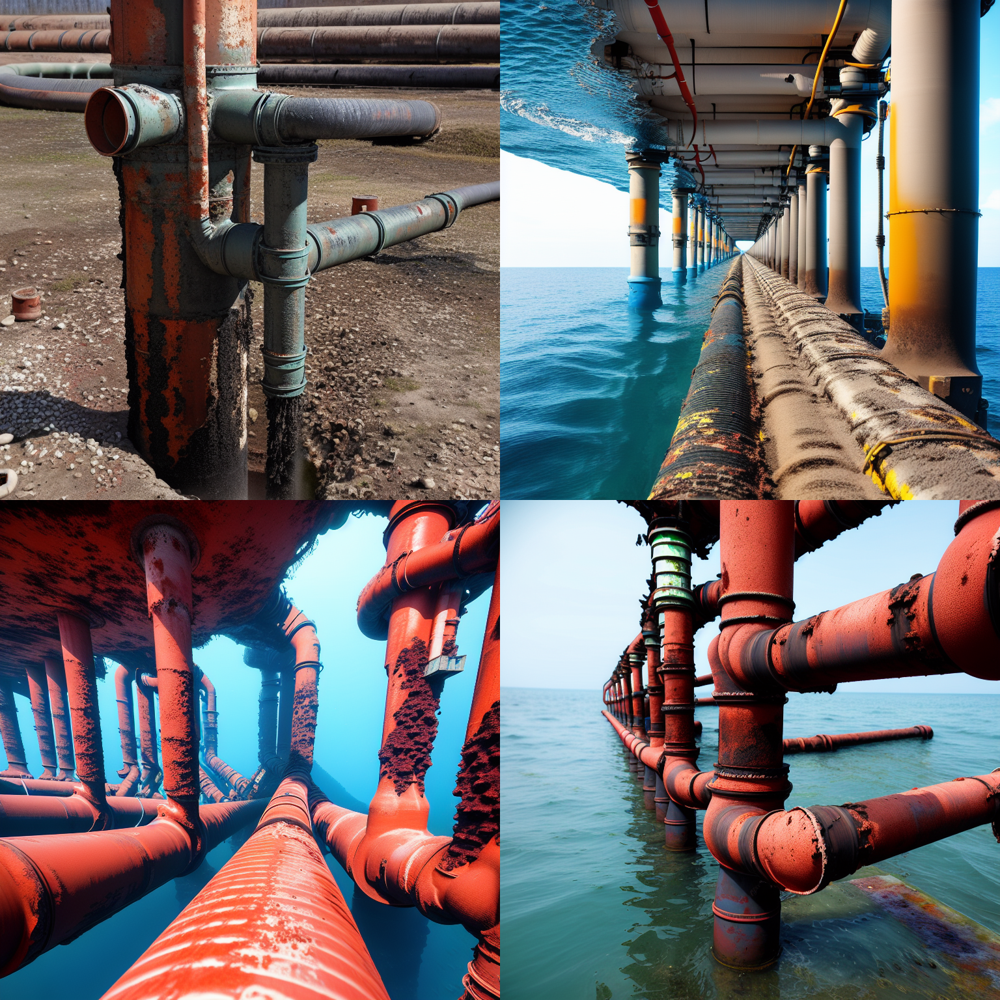

In [ ]:
prompts = [
    "a corroded pipeline under the sear, a more realistic",
    "a long pipeline under the sea, a more realistic",
    "Rust pipeline at the bottom of a big ocean, a more realistic",
    "severe corroded pipes in the sea, a more realistic"
]


images = pipeline(prompt=prompts,  num_inference_steps=25).images

make_image_grid(images, 2, 2)

In [ ]:
#image.save("pipeline.png")